In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = 'archive/data.xlsx'
data = pd.read_excel(file_path)

# Display the first few rows of the dataset to understand its structure
data.head()


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
from scipy import stats


# Step 1: Remove Missing Data
# Checking for any missing values in the dataset
missing_data = data.isnull().sum()

# Step 2: Outlier Removal
# Removing outliers using Z-score method for continuous variables
z_scores = np.abs(stats.zscore(data.select_dtypes(include=[np.number])))
data_cleaned = data[(z_scores < 3).all(axis=1)]

# Displaying the result of missing data check and the shape of the dataset after outlier removal
missing_data, data_cleaned.shape


(id                         0
 diagnosis                  0
 radius_mean                0
 texture_mean               0
 perimeter_mean             0
 area_mean                  0
 smoothness_mean            0
 compactness_mean           0
 concavity_mean             0
 concave points_mean        0
 symmetry_mean              0
 fractal_dimension_mean     0
 radius_se                  0
 texture_se                 0
 perimeter_se               0
 area_se                    0
 smoothness_se              0
 compactness_se             0
 concavity_se               0
 concave points_se          0
 symmetry_se                0
 fractal_dimension_se       0
 radius_worst               0
 texture_worst              0
 perimeter_worst            0
 area_worst                 0
 smoothness_worst           0
 compactness_worst          0
 concavity_worst            0
 concave points_worst       0
 symmetry_worst             0
 fractal_dimension_worst    0
 dtype: int64,
 (487, 32))

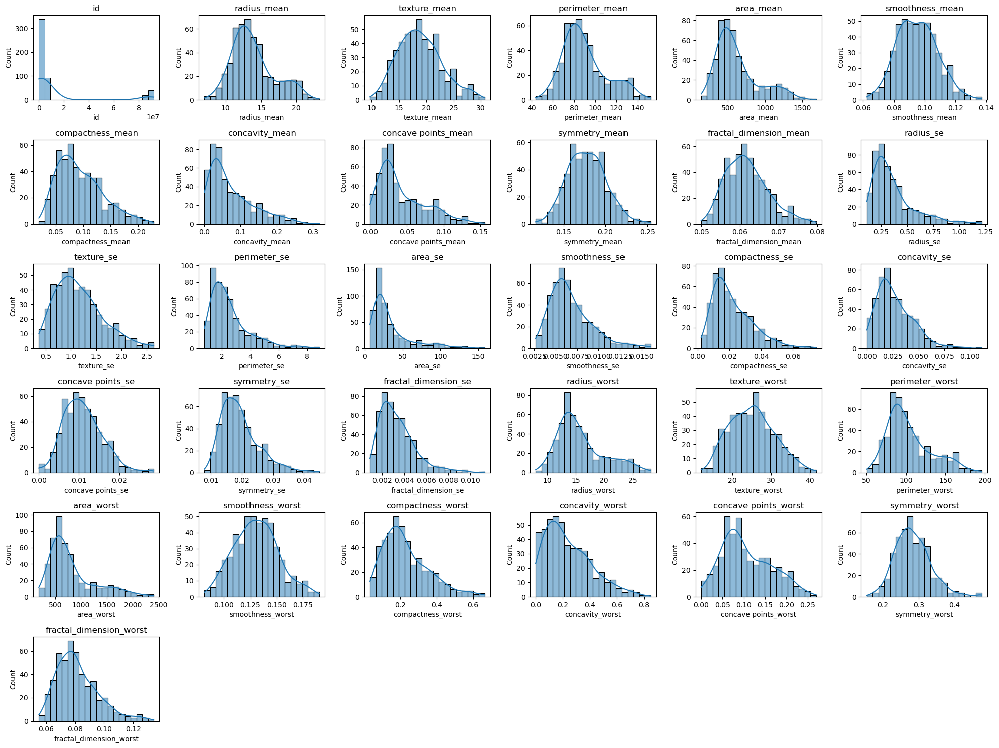

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting continuous variables for plotting
continuous_vars = data_cleaned.select_dtypes(include=[np.number]).columns

# Plotting histograms for continuous variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(continuous_vars):
    plt.subplot(6, 6, i + 1)
    sns.histplot(data_cleaned[var], kde=True, bins=20)
    plt.title(var)
    plt.tight_layout()

plt.show()


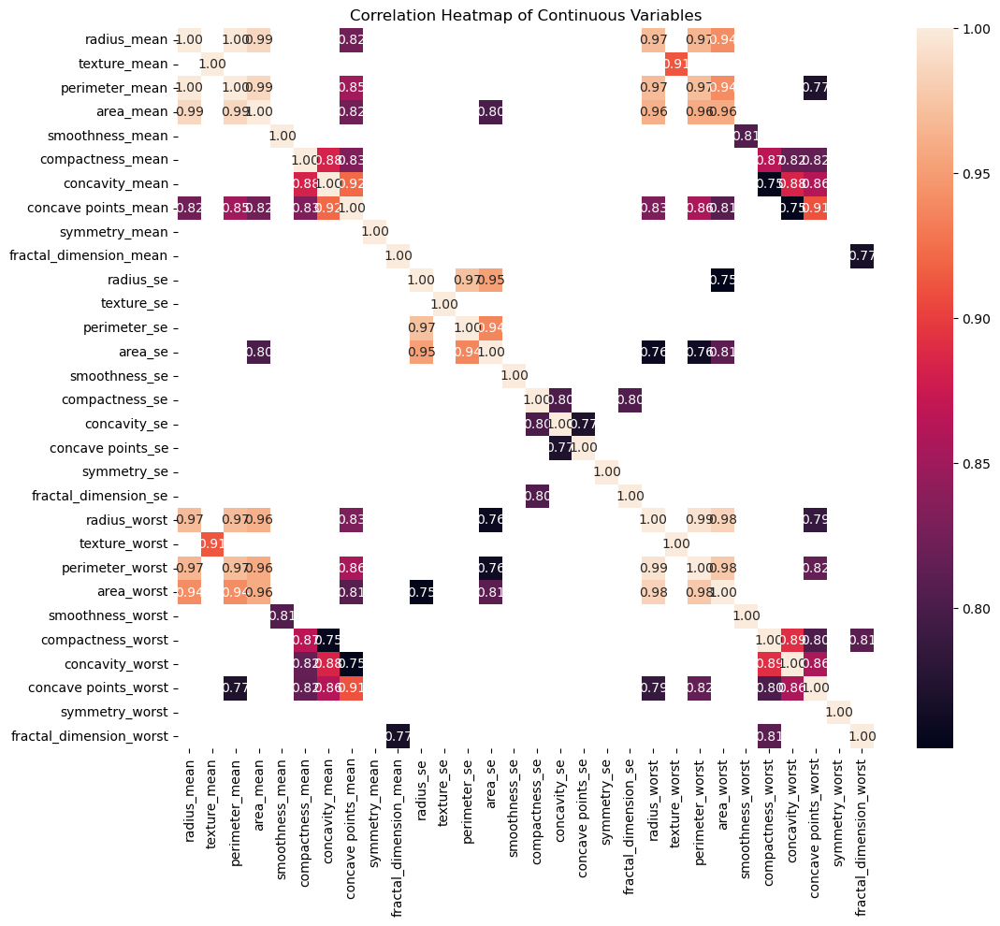

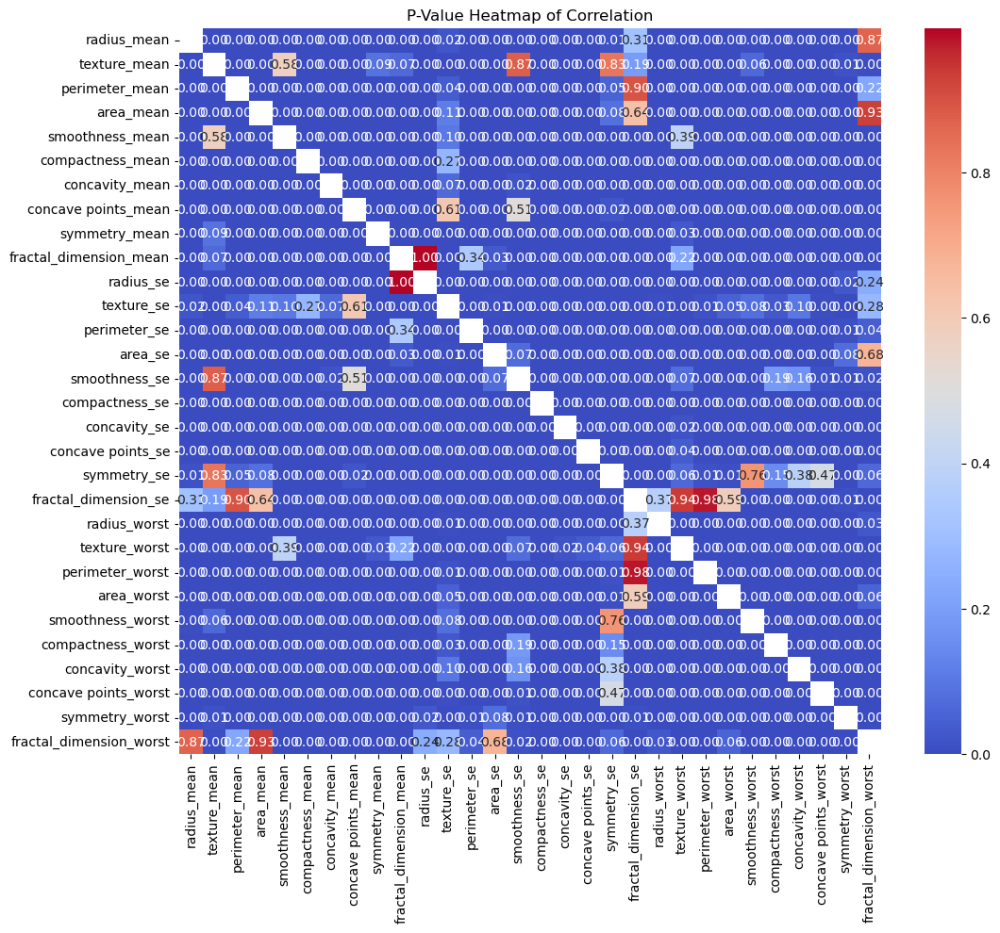

{'radius_mean': F_onewayResult(statistic=646.9810209786452, pvalue=8.46594057226382e-96),
 'texture_mean': F_onewayResult(statistic=118.09605934497965, pvalue=4.0586360478986136e-25),
 'perimeter_mean': F_onewayResult(statistic=697.2352724765257, pvalue=8.43625103617395e-101),
 'area_mean': F_onewayResult(statistic=573.0607465682347, pvalue=4.7345643103077244e-88),
 'smoothness_mean': F_onewayResult(statistic=83.65112340842511, pvalue=1.051850359203376e-18),
 'compactness_mean': F_onewayResult(statistic=313.23307856764194, pvalue=3.938263105887389e-56),
 'concavity_mean': F_onewayResult(statistic=533.7931262035482, pvalue=9.966555755074321e-84),
 'concave points_mean': F_onewayResult(statistic=861.6760200073069, pvalue=7.101150161059154e-116),
 'symmetry_mean': F_onewayResult(statistic=69.52744350046247, pvalue=5.73338402846732e-16),
 'fractal_dimension_mean': F_onewayResult(statistic=0.09345929487492208, pvalue=0.7599368037255626),
 'radius_se': F_onewayResult(statistic=268.8403269673

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np

# Separating continuous and categorical variables
continuous_vars = data.select_dtypes(include=['float64', 'int64']).columns
categorical_vars = data.select_dtypes(include=['object']).columns

# Removing 'id' as it's just an identifier
continuous_vars = continuous_vars.drop('id')

# Calculating correlations among continuous variables
correlation_matrix = data[continuous_vars].corr()

# Calculating p-values for the correlations
p_values = pd.DataFrame(index=correlation_matrix.columns, columns=correlation_matrix.columns)

for row in correlation_matrix.columns:
    for col in correlation_matrix.columns:
        if row != col:
            corr_test = stats.pearsonr(data[row], data[col])
            p_values[row][col] = corr_test[1]
        else:
            p_values[row][col] = np.nan

# Plotting the correlation heatmap
high_corr = correlation_matrix[abs(correlation_matrix) > 0.75]
plt.figure(figsize=(12,10))
sns.heatmap(high_corr, annot=True, fmt=".2f")
plt.title("Correlation Heatmap of Continuous Variables")
plt.show()

# Plotting the p-values heatmap
plt.figure(figsize=(12,10))
sns.heatmap(p_values.astype(float), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("P-Value Heatmap of Correlation")
plt.show()

# Pair plots of continuous variables
sns.pairplot(data[continuous_vars])
plt.suptitle("Pair Plot of Continuous Variables", y=1.02)
plt.show()


# Calculating mean, variance, and 95% confidence interval of the mean variance
mean_variance = data[continuous_vars].var().mean()
mean_variance_ci_lower = mean_variance - 1.96 * stats.sem(data[continuous_vars].var())
mean_variance_ci_upper = mean_variance + 1.96 * stats.sem(data[continuous_vars].var())

mean_variance, mean_variance_ci_lower, mean_variance_ci_upper

# Performing Chi-square test and ANOVA for categorical variables
# Since we have only one categorical variable 'diagnosis', we'll perform ANOVA between 'diagnosis' and each continuous variable
anova_results = {}

for var in continuous_vars:
    group_data = [data[var][data['diagnosis'] == category] for category in data['diagnosis'].unique()]
    anova_results[var] = stats.f_oneway(*group_data)

anova_results



In [37]:

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd


# Data Preprocessing
data['diagnosis'] = data['diagnosis'].map({'M': 1, 'B': 0})
X = data.drop('diagnosis', axis=1)
y = data['diagnosis']

# Standardizing the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=9014)

# Function to calculate specificity
def specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp)

# Models to train
models = {
    "Random Forest": RandomForestClassifier(random_state=9014),
    "Decision Tree": DecisionTreeClassifier(random_state=9014),
    "Naive Bayes": GaussianNB(),
    "Support Vector Machine": SVC(probability=True, random_state=9014),
    "Artificial Neural Network": MLPClassifier(max_iter=1000, random_state=9014),
    "Logistic Regression": LogisticRegression(random_state=9014)
}

# Training and evaluating models
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:,1] if hasattr(model, "predict_proba") else [0] * len(y_pred)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    spec = specificity(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)

    results[name] = [accuracy, precision, recall, spec, f1, auc]

# Results DataFrame
results_df = pd.DataFrame(results, index=['Accuracy', 'Precision', 'Recall', 'Specificity', 'F1 Score', 'AUC']).T

# Display the results
print(results_df.sort_values(by='Accuracy', ascending=False))


                           Accuracy  Precision    Recall  Specificity  \
Logistic Regression        0.994152   0.985714  1.000000     0.990196   
Artificial Neural Network  0.988304   0.971831  1.000000     0.980392   
Support Vector Machine     0.982456   0.971429  0.985507     0.980392   
Random Forest              0.959064   0.984375  0.913043     0.990196   
Decision Tree              0.953216   0.942029  0.942029     0.960784   
Naive Bayes                0.929825   0.925373  0.898551     0.950980   

                           F1 Score       AUC  
Logistic Regression        0.992806  0.999574  
Artificial Neural Network  0.985714  0.999858  
Support Vector Machine     0.978417  0.999147  
Random Forest              0.947368  0.998082  
Decision Tree              0.942029  0.951407  
Naive Bayes                0.911765  0.990764  


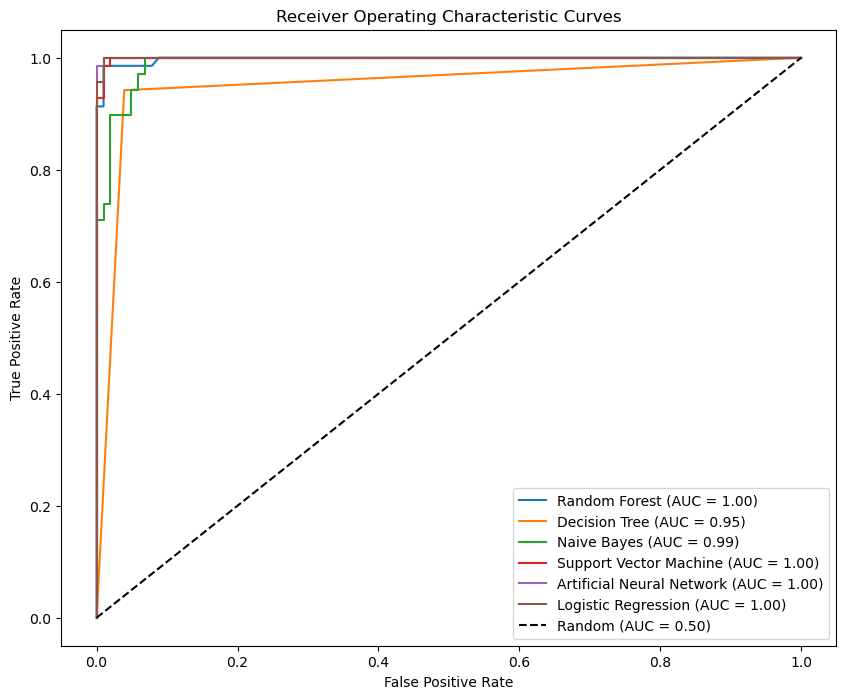

In [38]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# ... [previous code for loading data, preprocessing, and training models] ...

# Plotting ROC Curve for each model
plt.figure(figsize=(10, 8))

for name, model in models.items():
    # Predict probabilities
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
    elif hasattr(model, "decision_function"):  # For SVM
        y_proba = model.decision_function(X_test)
    else:
        y_proba = [0] * len(y_test)

    # Compute ROC curve and AUC
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)

    # Plotting
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Curves')
plt.legend(loc='lower right')
plt.show()
